<a href="https://colab.research.google.com/github/bild12/EspIA/blob/main/regularizacion_G4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://www.javeriana.edu.co/recursosdb/20125/5571273/escudo-circular.png" alt="Your Image" style="float:left;">
</div><h1>Pontificia Universidad Javeriana</h1>

---


<h2>Evaluación formativa</h2>
<h1>Practiquemos regularización</h1>

---


**Tecnicas Estocasticas**

**Especialización en Inteligencia Artificial**

**Pontificia Universidad Javeriana**

### Integrantes:
Manuel Huérfano Castro - huerfanom@javeriana.edu.co <br>
Felipe Rangel - feliperangel@javeriana.edu.co <br>
Jessica Barreto - barretoj@javeriana.edu.co <br>
Johan Sanchez - johanw-sanchez@javeriana.edu.co <br>
Ivette Lopez - lopezdbi@javeriana.edu.co <br>

# **Notebook_2: Regularización.**
En nuestro segundo notebook de esta unidad nos centraremos en las estrategias de regularización. El problema de determinar precios adecuados (conocido en inglés como pricing) es fundamental dentro de la estrategia de una empresa o firma. No en vano el precio es una de las características de un producto que usualmente ayuda a definir la estrategia. Dado que los precios usualmente tienen conexión con el valor que los clientes asignan a los productos, se trata de un fenómeno de sicología del consumidor. Por eso los precios incluyen la forma en que los consumidores perciben el valor del producto y sus características, las cuales no son todas necesariamente tangibles.

El caso de estudio se relaciona con un proceso de estimación del precio de vehículos a partir de las características de este, a través del cual trabajaremos el concepto de regularización en un modelo predictivo.

La base de datos contiene 27 variables y 93 observaciones. Pero para la variable de respuesta tenemos tres diferentes precios (básico, promedio y equipado). Usar uno de ellos como predictor del otro probablemente no tiene sentido de negocio, porque no es el tipo de característica que va a estar disponible para predecir el precio de un nuevo vehículo. Por eso, dos de ellos serán descartados y solo dejaremos el precio promedio.

Por su parte, las variables predictoras numéricas están todas asociadas a características físicas del carro y su definición es evidente del nombre de la variable.

La base de datos y los principales análisis fueron desarrollados por el profesor *Jorge Alvarado* para el curso de Métodos y aplicaciones de analítica I

**Actualizar librerías**: Google colab no siempre tiene las últimas versiones de las librerías, por lo tanto, es necesario descargarlas de los repositorios. Vamos a descargar la última versión de pandas-profiling. *No olvidar reiniciar el Kernel si el notebook lo solicita*

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     / 17.9 MB 35.1 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 22.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 22.9 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=390044 sha256=893a56ea7807a8dc1474672a4565f59843d11dff7e9d08cb38030f22261521b1
  Stored in directory: /tmp/pip-ephem-wheel-cache-msih9iy1/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=489bcdcf49fe9f63118cb7459a6ac02655b0fd30726712b34b6a1a8068b43791
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Succe

**Importar librerías**: pandas para manejar los datos como dataframes, matplotlib para realizar los gráficos, seaborn para graficar la matriz de correlaciones, pandas_profiling para construir un resumen de la base de datos, pyplot , sklearn.model_selection para dividir la base de datos en entrenamiento y validación, además, se usa para del proceso de validación cruzada, numpy para las operaciones matemáticas, statsmodels para realizar los procedimientos de modelo de regresión y regularización.

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import ydata_profiling as pp
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.base import BaseEstimator, RegressorMixin
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.graphics.gofplots import ProbPlot

**Cargar el archivo de datos:** Usaremos el conjunto de datos pricingcarros

In [ ]:
!pip install gdown
import gdown



In [ ]:
# Descargamos el archivo
file_id = '13hgcAs6gb7YKtQDcCLuH4Y4nSBKyVSJ2'

# Formar el enlace de descarga
url = f'https://drive.google.com/uc?id={file_id}'

# Descargar el archivo usando gdown, y especificar el nombre del archivo de salida
filename = 'carros2011imputado.csv'
gdown.download(url, filename, quiet = False)

# Leer los datos usando el archivo descargado, con el delimitador de coma
df = pd.read_csv(filename, delimiter=';')

# Mostrar las primeras filas del dataset para verificar la carga correcta
df.head()

Downloading...
From: https://drive.google.com/uc?id=13hgcAs6gb7YKtQDcCLuH4Y4nSBKyVSJ2
To: /content/carros2011imputado.csv
100%|██████████| 13.4k/13.4k [00:00<00:00, 25.1MB/s]


,ID,tipo,millas_por_galon_ciudad,millas_por_galon_carretera,numero_de_airbags,tracción,cilindros,litros_motor,caballos_fuerza,revoluciones_por_minuto,...,espacio_para_dar_la_u,espacio_asiento_trasero,capacidad_baul,peso_en_libras,hecho_o_no_en_USA,precio_basico,precio_promedio,precio_equipado,fabricante,modelo
0,1,Small,25,31,No tiene,Delantera,4,"1,8",140,6300,...,37,"26,5",11,2705,Hecho fuera de USA,"12,9","15,9","18,8",Acura,Integra
1,2,Midsize,18,25,Conductor y copiloto,Delantera,6,"3,2",200,5500,...,38,30,15,3560,Hecho fuera de USA,"29,2","33,9","38,7",Acura,Legend
2,3,Compact,20,26,Conductor,Delantera,6,"2,8",172,5500,...,37,28,14,3375,Hecho fuera de USA,"25,9","29,1","32,3",Audi,90
3,4,Midsize,19,26,Conductor y copiloto,Delantera,6,"2,8",172,5500,...,37,31,17,3405,Hecho fuera de USA,"30,8","37,7","44,6",Audi,100
4,5,Midsize,22,30,Conductor,Trasera,4,"3,5",208,5700,...,39,27,13,3640,Hecho fuera de USA,"23,7",30,"36,2",BMW,535i


**Visualizar datos**: Vamos a ver las primeras observaciones del conjunto de datos

**Limpieza de la base de datos**

En este caso, como lo mencionamos anteriormente, debemos eliminar algunas columnas de la base de datos, las columnas de precio_basico y precio_equipado que no podemos utilizar como predictoras y la columna de ID, porque esta no provee ninguna información relevante para el análisis.

In [ ]:
df = df.iloc[:,np.r_[1:22, 23, 25:27]]
df.head()

,tipo,millas_por_galon_ciudad,millas_por_galon_carretera,numero_de_airbags,tracción,cilindros,litros_motor,caballos_fuerza,revoluciones_por_minuto,rev_motor_por_milla,...,distancia_entre_ruedas,ancho,espacio_para_dar_la_u,espacio_asiento_trasero,capacidad_baul,peso_en_libras,hecho_o_no_en_USA,precio_promedio,fabricante,modelo
0,Small,25,31,No tiene,Delantera,4,"1,8",140,6300,2890,...,102,68,37,"26,5",11,2705,Hecho fuera de USA,"15,9",Acura,Integra
1,Midsize,18,25,Conductor y copiloto,Delantera,6,"3,2",200,5500,2335,...,115,71,38,30,15,3560,Hecho fuera de USA,"33,9",Acura,Legend
2,Compact,20,26,Conductor,Delantera,6,"2,8",172,5500,2280,...,102,67,37,28,14,3375,Hecho fuera de USA,"29,1",Audi,90
3,Midsize,19,26,Conductor y copiloto,Delantera,6,"2,8",172,5500,2535,...,106,70,37,31,17,3405,Hecho fuera de USA,"37,7",Audi,100
4,Midsize,22,30,Conductor,Trasera,4,"3,5",208,5700,2545,...,109,69,39,27,13,3640,Hecho fuera de USA,30,BMW,535i


**Resumir las características de la base de datos** en un perfil (profile), nos proporciona un resumen de la base de datos que incluye el número de variables, el número de observaciones, el total de datos perdidos y el tipo de variable para cada columna del dataframe, además, incluye estadística descriptiva básica para cada variable

In [ ]:
profile= pp.ProfileReport(df,minimal=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Análisis**
1.   En la sección *Overview* se puede observar que la base de datos quedó conformada por 93 observaciones y 24 variables, 17 de ellas numéricas y 7 categóricas, en particular la variable modelo tiene valores únicos para cada observación lo que implica una alta cardinalidad. En la base de datos no se tienen valores perdidos.

2.   Para cada variable se presenta un resumen estadístico básico, por ejemplo, para la variable de respuesta, el rango está entre 9.4 y 61.9 unidades monetarias, con un promedio de 19.51 um. Además, el diagrama de barras muestra una alta asimetría, con una mediana de 17.7 um, por debajo de la media.

3.   Por su alta cardinalidad, vamos a eliminar la variable modelo de la base de datos.



In [ ]:
df = df.iloc[:,0:23]
df.head()

,tipo,millas_por_galon_ciudad,millas_por_galon_carretera,numero_de_airbags,tracción,cilindros,litros_motor,caballos_fuerza,revoluciones_por_minuto,rev_motor_por_milla,...,longitud,distancia_entre_ruedas,ancho,espacio_para_dar_la_u,espacio_asiento_trasero,capacidad_baul,peso_en_libras,hecho_o_no_en_USA,precio_promedio,fabricante
0,Small,25,31,No tiene,Delantera,4,"1,8",140,6300,2890,...,177,102,68,37,"26,5",11,2705,Hecho fuera de USA,"15,9",Acura
1,Midsize,18,25,Conductor y copiloto,Delantera,6,"3,2",200,5500,2335,...,195,115,71,38,30,15,3560,Hecho fuera de USA,"33,9",Acura
2,Compact,20,26,Conductor,Delantera,6,"2,8",172,5500,2280,...,180,102,67,37,28,14,3375,Hecho fuera de USA,"29,1",Audi
3,Midsize,19,26,Conductor y copiloto,Delantera,6,"2,8",172,5500,2535,...,193,106,70,37,31,17,3405,Hecho fuera de USA,"37,7",Audi
4,Midsize,22,30,Conductor,Trasera,4,"3,5",208,5700,2545,...,186,109,69,39,27,13,3640,Hecho fuera de USA,30,BMW


**División de la base de datos: Entrenamiento y Validación.**
Como lo hicimos en el notebook anterior, vamos a usar la función train_test_split fijando el tamaño de la base de prueba con test_size a un 20% y garantizando la reproducibilidad de los resultados con una semilla aleatoria fija usando random_state. sin embargo, como tenemos varias variables categóricas, vamos a construir variables dummy para ellas antes de dividir la base, para no tener problemas en la fase de validación porque algunas categorías podrían quedar solo en la base de entrenamiento o en la de validación.



In [ ]:
df2=pd.get_dummies(df)
df_train, df_test = train_test_split(df, test_size=0.2, random_state=99)
df_train2, df_test2 = train_test_split(df2, test_size=0.2, random_state=99)

**Realizar el análisis de correlaciones**. Ahora, para la base de entrenamiento, se construye un perfil completo que incluye los gráficos de dispersión entre cada pareja de variables, así se puede observar la relación entre ellas y además una visualización de la matriz de correlaciones. En la sección de *warnings* del perfil se encuentran una lista de las correlaciones significativamente altas.

In [ ]:
profile2= pp.ProfileReport(df_train, explorative= True)
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Análisis**

1.   Al observar el gráfico de las correlaciones de Pearson, en la sección de *correlations*, se observan correlaciones muy altas entre varias de las variables predictoras.
2.   Para comprobar la relación entre la variable de respuesta y las predictoras, se puede observar la gráfica de dispersión en la sección de *interactions*, allí, la nube de puntos se aproxima considerablemente a una recta con pendiente positiva, para varios de los predictores, por ejemplo, caballos_fuerza.
3.   La variable df_index es artificial y no se debe tener en cuenta en los análisis








**Cálculo y visualización de la matriz de correlaciones**: Otra forma de obtener los valores de los coeficientes de correlación, para cada pareja de variables, es usar la función corr, pero solo la vamos a calcular para las variables predictoras de tipo numérico. Además, para construir el correlograma utilizaremos la librería seaborn con la paleta de colores vlag_r para obtener azules en las correlaciones positivas y rojos en las negativas.

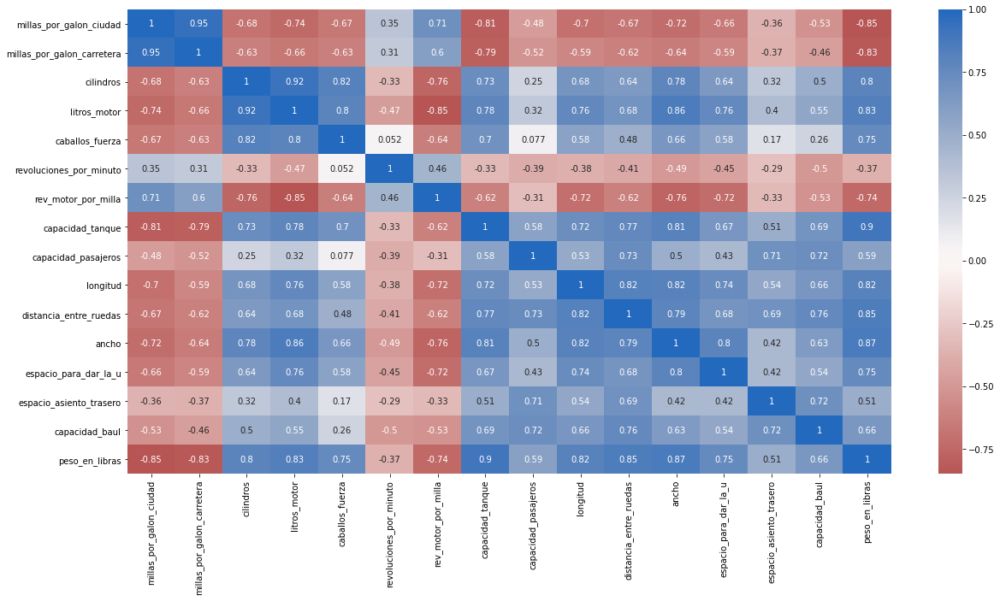

In [ ]:
df1_train = df_train.iloc[:,np.r_[1:3, 5:10, 11:20]]
mat_cor= df1_train.corr()
mat_cor
plt.figure(figsize=(20,10))
sns.heatmap(mat_cor, annot = True, center=0, cmap="vlag_r")

**Análisis.**
En la matriz anterior, se calcula para cada pareja de variables, el coeficiente de correlación de Pearson. Como lo habíamos señalado antes, notamos que la correlación entre varias de las variables predictoras es muy alta, por ejemplo, entre las dos primeras es superior a 0.95. Esta estructura nos indica que una alta multicolinealidad, pero además, si tenemos en cuenta las variables categóricas, nos damos cuenta que con tan pocas observaciones y tantos parámetros a estimar, el riesgo de overfitting es muy alto.

**Modelamiento**

El primer modelo que vamos a construir incluye a todas las variables predictoras, incluyendo a las variables categóricas, en las cuales, cada categoría se representa por una variable binaria, lo que aumenta el número de parámetros a estimar. Utilizaremos la función ols de la libería statsmodels.formula.api,

In [ ]:
formula_1='precio_promedio ~ tipo + millas_por_galon_ciudad + millas_por_galon_carretera + numero_de_airbags + tracción + cilindros + litros_motor + caballos_fuerza + revoluciones_por_minuto + rev_motor_por_milla + transmisión_manual + capacidad_tanque + capacidad_pasajeros + longitud + distancia_entre_ruedas + ancho + espacio_para_dar_la_u + espacio_asiento_trasero + capacidad_baul + peso_en_libras + hecho_o_no_en_USA + fabricante'
modelo_0 = smf.ols(formula_1, data=df_train).fit()
print(modelo_0.summary())

                            OLS Regression Results                            
Dep. Variable:        precio_promedio   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     11.84
Date:                Fri, 16 Jul 2021   Prob (F-statistic):           3.16e-07
Time:                        02:44:39   Log-Likelihood:                -141.59
No. Observations:                  74   AIC:                             395.2
Df Residuals:                      18   BIC:                             524.2
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

**Análisis.**
Incluyendo las diferentes categorías de las variables categóricas, el modleo utilizó 55 variables predictoras para las 74 observaciones, de estas solo fabricante[T.Lincoln], fabricante[T.Mercedes-Benz], caballos_fuerza y ancho resultaron significativas al 5%. El modelo en sí, es significativo y parece explicar un 89.1% de la variabilidad del precio, pero con tantas variables predictoras espurias que están incluidas, las conclusiones estadísticas no son confiables.

**Modelo 2**

Si construimos otro modelo en el cual no incluyamos todas las variables, sino solo aquellas que resultaron significativas, obtenemos los siguientes resultados.

In [ ]:
modelo_1 = smf.ols(formula='precio_promedio ~ caballos_fuerza + ancho + fabricante', data=df_train).fit()
print(modelo_1.summary())

                            OLS Regression Results                            
Dep. Variable:        precio_promedio   R-squared:                       0.906
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                     13.05
Date:                Fri, 16 Jul 2021   Prob (F-statistic):           2.55e-13
Time:                        02:44:43   Log-Likelihood:                -187.90
No. Observations:                  74   AIC:                             439.8
Df Residuals:                      42   BIC:                             513.5
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

**Análisis.**
Para este nuevo modelo, el R cuadrado ajustado disminuye al 83.7%, es decir, este conjunto de variables predictoras explican gran parte de lo que explica el modelo completo, sin embargo, la variable ancho dejó de ser significativa y algunas de las categorías que no lo eran, ahora si tienen un p-value por debajo del 5%, por ejemplo, fabricante[T.Audi].

**Regularización**

La gran cantidad de variables predictoras disponibles dificulta el proceso de selección de predictoras para el modelo definitivo. en este caso, en lugar de seguir la ruta de los métodos stepwise y best subsets, vamos a utilizar los métodos de penalización para encontrar un conjunto de variables predictoras adecuado.

**Ridge**

Iniciamos con el modelo Ridge, el cual podemos obtener con la función OLS.fit_regularized de la librería statsmodels. Sin embargo, para poder usar este procedimiento primero debemos construir variables dummy para cada variable categórica y eliminar una de esas categorías. Con este procedimiento, usando el método OLS, obtenemos los mismos resultados para nuestro modelo inicial.

In [ ]:
X_train  = df_train2.drop(["tipo_Compact", "numero_de_airbags_Conductor", "tracción_Delantera", "transmisión_manual_No", "hecho_o_no_en_USA_Hecho en USA",
"fabricante_Acura", "precio_promedio"], axis=1)
Y_train = df_train.iloc[:,21]
modelo_0d = sm.OLS(Y_train, sm.add_constant(X_train)).fit()
print(modelo_0d.summary())

                            OLS Regression Results                            
Dep. Variable:        precio_promedio   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     11.84
Date:                Fri, 16 Jul 2021   Prob (F-statistic):           3.16e-07
Time:                        02:44:48   Log-Likelihood:                -141.59
No. Observations:                  74   AIC:                             395.2
Df Residuals:                      18   BIC:                             524.2
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

Ahora, utilizando el procedimiento fit_regularized con el método 'elastic net', el cual, cuando el parámetro 'L1_wt' es igual a 0, se convierte en el método Ridge, vamos a encontrar nuevos valores para los coeficientes del modelo de regresión. Utilizaremos un valor de 0.25 para el hiperparámetro.

In [ ]:
modelo_ridge = sm.OLS(Y_train, sm.add_constant(X_train)).fit_regularized(method='elastic_net', alpha=0.25, L1_wt=0)
resultados=pd.DataFrame(modelo_0d.params)
resultados.columns=['modelo original']
resultados['Ridge'] = modelo_ridge.params
print(resultados)

                                        modelo original         Ridge
const                                      6.168244e+01  9.172592e-02
millas_por_galon_ciudad                    2.029725e-01 -1.313786e-01
millas_por_galon_carretera                -2.808939e-01 -5.348839e-02
cilindros                                  2.718601e-01  5.073828e-01
litros_motor                              -2.623133e+00  3.797464e-01
caballos_fuerza                            1.576844e-01  1.623385e-01
revoluciones_por_minuto                   -2.702396e-03 -2.155045e-03
rev_motor_por_milla                       -1.293325e-04  5.366498e-03
capacidad_tanque                           1.103099e+00 -2.089250e-01
capacidad_pasajeros                       -3.517947e+00 -7.585683e-01
longitud                                   2.348181e-01  5.244974e-02
distancia_entre_ruedas                     1.866463e-01  5.662979e-01
ancho                                     -1.470147e+00 -8.431924e-01
espacio_para_dar_la_

**Análisis**

Los nuevos coeficientes se interpretan en el sentido de sus mayores o menores valores absolutos relativos y también de su signo, el cual continúa indicando el sentido de la relación con la variable de respuesta.
Por ejemplo, la variable con el mayor coeficiente la que indica que el vehículo no tiene airbags, su signo es negativo, indicando que cuando se presenta esta situación el precio disminuye. Otra variable con un coeficiente muy alto es la del fabricante Mercedes-Benz, que con un signo positivo indica un aumento del precio para los vehículos de esta marca.

**Lasso**

Los coeficientes para el método Lasso también se pueden hallar con la función fit_regularized, usando el método 'elastic net', pero fijando el parámetro 'L1_wt' igual a 1. Vamos a encontrar nuevos valores para los coeficientes del modelo de regresión usando un valor de 0.25 para el hiperparámetro.

In [ ]:
modelo_lasso = sm.OLS(Y_train, sm.add_constant(X_train)).fit_regularized(method='elastic_net', alpha=0.25, L1_wt=1)
resultados['Lasso'] = modelo_lasso.params
print(resultados)

                                        modelo original  ...      Lasso
const                                      6.168244e+01  ...   1.242356
millas_por_galon_ciudad                    2.029725e-01  ...   0.140914
millas_por_galon_carretera                -2.808939e-01  ...   0.035479
cilindros                                  2.718601e-01  ...   2.118363
litros_motor                              -2.623133e+00  ...   0.000000
caballos_fuerza                            1.576844e-01  ...   0.104594
revoluciones_por_minuto                   -2.702396e-03  ...  -0.002102
rev_motor_por_milla                       -1.293325e-04  ...  -0.000195
capacidad_tanque                           1.103099e+00  ...  -0.054981
capacidad_pasajeros                       -3.517947e+00  ...  -0.204347
longitud                                   2.348181e-01  ...  -0.014570
distancia_entre_ruedas                     1.866463e-01  ...   0.000000
ancho                                     -1.470147e+00  ...  -0

**Análisis**

La ventaja de este procedimiento es que lleva la mayoría de los coeficientes a 0, dejando solo a aquellas variables predictoras que mejor modelan el comportamiento de la variable de respuesta. En este caso, como en el anterior, los valores específicos de los coeficientes no son interpretables, pero si lo es su signo y peso relativo. Aquí, nuevamente la variable de la marca Mercedes-Benz continúa como una de las mejores predictoras, así como también, si el vehículo fue fabricado en USA y el tamaño, en particular el midsize.

**Efecto del hiperparámetro**

El hiperparámetro genera cambios importantes en los modelos, y la escogencia de su valor no siempre es fácil. Veamos, por ejemplo, cómo cambian los coeficientes de una regresión regularizada dependiendo del valor escogido.

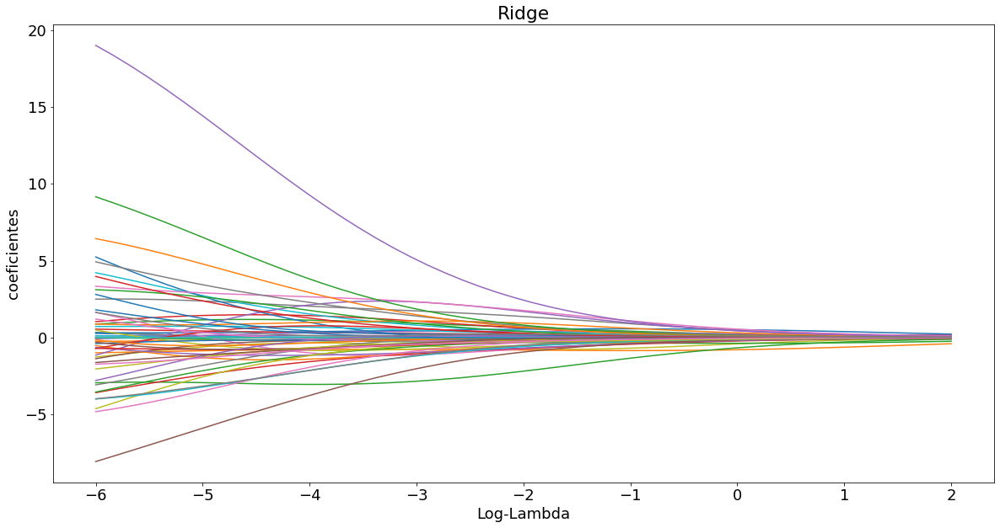

In [ ]:
log_lambda_seq = np.linspace(-6, 2, 50)
lambda_seq = np.exp(log_lambda_seq)

coeffs_array = []
for lamb in lambda_seq:
 modelo_ridge = sm.OLS(Y_train, sm.add_constant(X_train)).fit_regularized(method='elastic_net', alpha=lamb, L1_wt=0)
 coeffs_array.append(list(modelo_ridge.params))

plt.figure(figsize=(20,10))
plt.rcParams.update({'font.size': 18})
beta_coeffs = [x[1:] for x in coeffs_array]
plt.plot(log_lambda_seq, beta_coeffs)
plt.title('Ridge')
plt.ylabel('coeficientes')
plt.xlabel('Log-Lambda')
plt.show()

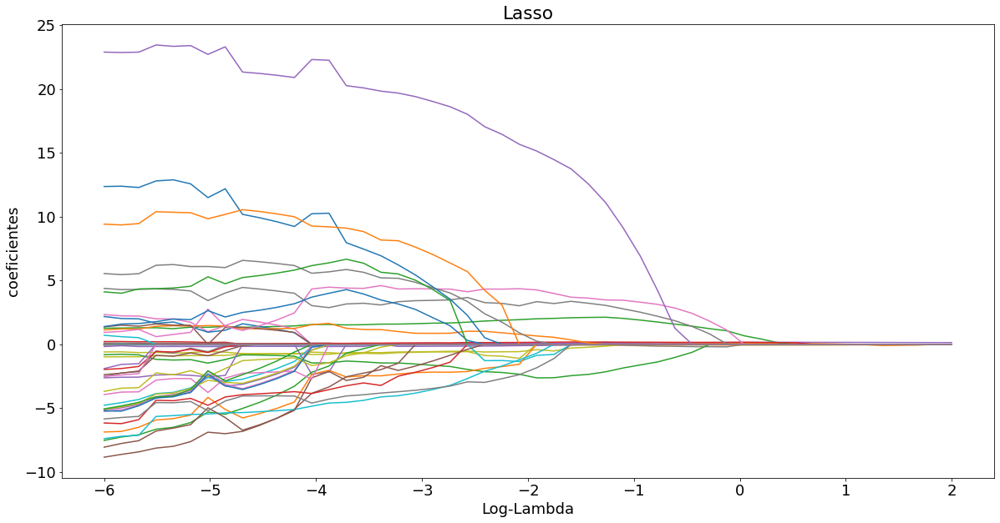

In [ ]:
log_lambda_seq = np.linspace(-6, 2, 50)
lambda_seq = np.exp(log_lambda_seq)

coeffs_array = []
for lamb in lambda_seq:
 modelo_lasso = sm.OLS(Y_train, sm.add_constant(X_train)).fit_regularized(method='elastic_net', alpha=lamb, L1_wt=1)
 coeffs_array.append(list(modelo_lasso.params))

plt.figure(figsize=(20,10))
plt.rcParams.update({'font.size': 18})
beta_coeffs = [x[1:] for x in coeffs_array]
plt.plot(log_lambda_seq, beta_coeffs)
plt.title('Lasso')
plt.ylabel('coeficientes')
plt.xlabel('Log-Lambda')
plt.show()

La variable predictora con el mayor p-value, muy por encima del nivel de significancia, es tiempo, por lo cual, la vamos a eliminar del modelo.

Al eliminar la variable tiempo, las métricas de eficiencia mejoran levemente y el modelo sigue siendo significativo, por lo cual, podemos hacer otra iteración. De las predictoras restantes, la variable con el mayor p-value, es densidad, por lo cual, la vamos a eliminar del modelo.

**Validación cruzada**

Para poder determinar el mejor valor para el hiperparámetro vamos a utilizar validación cruzada, es decir, creamos múltiples bases de entrenamiento y evaluándolos sus correspondientes bases de validación. La medida que vamos a utilizar es el MSE. Para hacer este proceso utilizaremos la función cross_val_score de la libreria sklearn, para que reconozca el modelo realizado con statsmodels se debe programar una clase de envoltura que convierta los resultados del modelo en objetos interpretables para el cross_val_scor, también usaremos la función RepeatedKFold para generar 5 lotes con 5 repeticiones cada uno.

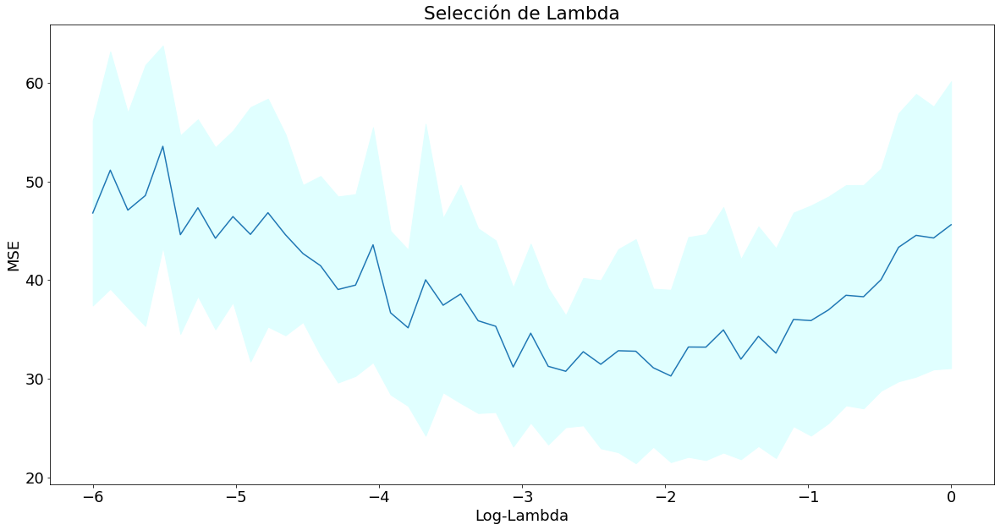

In [ ]:
class SMWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, model_class, fit_intercept=True):
        self.model_class = model_class
        self.fit_intercept = fit_intercept
    def fit(self, X, y):
        if self.fit_intercept:
            X = sm.add_constant(X)
        self.model_ = self.model_class(y, X)
        self.results_ = self.model_.fit_regularized(method='elastic_net', alpha=lamb, L1_wt=1)
        return self
    def predict(self, X):
        if self.fit_intercept:
            X = sm.add_constant(X)
        return self.results_.predict(X)

log_lambda_seq = np.linspace(-6, 0, 50)
lambda_seq = np.exp(log_lambda_seq)

means_array = []
limitinf_array = []
limitsup_array = []
for lamb in lambda_seq:
 scores = cross_val_score(SMWrapper(sm.OLS), X_train, Y_train, cv=RepeatedKFold(n_splits=5, n_repeats=5), scoring='neg_mean_squared_error')
 means_array.append(-scores.mean())
 limitinf_array.append(-scores.mean()-0.421*scores.std())
 limitsup_array.append(-scores.mean()+0.421*scores.std());


plt.figure(figsize=(20,10))
plt.rcParams.update({'font.size': 18})
plt.plot(log_lambda_seq, means_array)
plt.title('Selección de Lambda')
plt.ylabel('MSE')
plt.xlabel('Log-Lambda')
plt.fill_between(log_lambda_seq, limitsup_array, limitinf_array, color = 'lightcyan')
plt.show()

**Análisis**

La gráfica anterior fue realizada para el modelo Lasso, una similar se puede hacer para Ridge, allí podemos ver que el mínimo error lo encontramos con una valor aproximado de -2 para el log-lambda, con el cual, podemos encontrar los coeficientes para el modelo lineal.

In [ ]:
modelo_lasso2 = sm.OLS(Y_train, sm.add_constant(X_train)).fit_regularized(method='elastic_net', alpha=np.exp(-2), L1_wt=1)
resultados=pd.DataFrame(modelo_lasso2.params)
resultados.columns=['modelo Lasso']
print(resultados)

                                        modelo Lasso
const                                       8.436701
millas_por_galon_ciudad                     0.036715
millas_por_galon_carretera                  0.001868
cilindros                                   1.964975
litros_motor                                0.000000
caballos_fuerza                             0.087223
revoluciones_por_minuto                    -0.002015
rev_motor_por_milla                        -0.000477
capacidad_tanque                           -0.031794
capacidad_pasajeros                        -0.541018
longitud                                   -0.004042
distancia_entre_ruedas                      0.000000
ancho                                      -0.025396
espacio_para_dar_la_u                       0.000000
espacio_asiento_trasero                     0.153921
capacidad_baul                             -0.094909
peso_en_libras                              0.000267
tipo_Large                                  0.

**Análisis**

Las variables con los coeficientes más altos (en valor absoluto) son fabricante_Mercedes-Benz, hecho_o_no_en_USA_Hecho fuera de USA, tipo_Midsize, numero_de_airbags_No tiene y fabricante_Nissan, junto a otras 14 que tienen coeficientes diferentes de 0, las demás variables fueron eliminadas del modelo.

**Validación**

El último procedimiento que debemos realizar es utilizar la base de datos de prueba y comparar los tres modelos obtenidos, el modelo con los predictores originales, el modelo con tres predictores, resultado del procedimiento stepwise o best subsets y este último modelo obtenido al incluir el inverso de la distancia al cuadrado. Para este último modelo es necesario construir la nueva variable para los datos frescos.

Ahora calculemos el error de predicción para los tres modelos y seleccionamos el que tenga el valor más bajo. Sin embargo, debido al proceso de aleatorización, dos fabricantes (Plymouth y BMW) no fueron incluidos en la base entrenamiento, por lo tanto, para no modificar la base de datos de manera arbitraria, no vamos a tener en cuenta esas dos observaciones (observación 15 y observación 17) para hacer las predicciones en ninguno de los modelos.

In [ ]:
X_test  = df_test2.drop(["tipo_Compact", "numero_de_airbags_Conductor", "tracción_Delantera", "transmisión_manual_No", "hecho_o_no_en_USA_Hecho en USA",
"fabricante_Acura", "precio_promedio"], axis=1)
Y_test = df_test.iloc[:,21]

RMSE_0 = np.sqrt(((modelo_0.predict(df_test.iloc[np.r_[0:15,16:17,18:19],:]) - df_test.iloc[np.r_[0:15,16:17,18:19],21]) ** 2).sum()/df_test.iloc[np.r_[0:15,16:17,18:19],21].size)
print("RSME modelo completo: ", RMSE_0)

RMSE_1 = np.sqrt(((modelo_1.predict(df_test.iloc[np.r_[0:15,16:17,18:19],:]) - df_test.iloc[np.r_[0:15,16:17,18:19],21]) ** 2).sum()/df_test.iloc[np.r_[0:15,16:17,18:19],21].size)
print("RSME modelo 3 predictores: ", RMSE_1)

RMSE_2 = np.sqrt(((modelo_lasso2.predict(sm.add_constant(X_test.iloc[np.r_[0:15,16:17,18:19],:])) - df_test.iloc[np.r_[0:15,16:17,18:19],21]) ** 2).sum()/df_test.iloc[np.r_[0:15,16:17,18:19],21].size)
print("RSME modelo Lasso: ", RMSE_2)

RSME modelo completo:  5.93218719192179
RSME modelo 3 predictores:  3.7274247835658953
RSME modelo Lasso:  4.220988987358524


**Análisis**

El modelo reducido resulta el mejor predictor en la base de datos de validación, aunque es difícil saber o entender el efecto específico de cada variable independiente, en parte por la falta de estandarización y los problemas mencionados de multicolinealidad y parte por la baja relación casos/variables. En el modelo Lasso, como se explicó, el tamaño relativo y signo de los coeficientes da idea de la importancia relativa de las variables.

Los modelos regularizados pueden ser una alternativa a los modelos insesgados para mejorar la predictibilidad, particularmente en entornos de baja razón casos/variables o con multicolinealidad. La interpretación de los resultados tiene cambios importantes que deben tenerse en cuenta. La idea de la regularización puede aplicarse a múltiples tipos de modelos que estén buscando minimizar una función de error, lo que la hace altamente aplicable en machine learning.